# SConvNet + Discriminator

The idea is to train SConvNet with pairs $(X,y)$ where $X$ is a large patch and $y$ a smaller one within $X$. After that, training is made like an adversarial framework with a discriminator $D$ that classifies patch $y$ into real or not (in other words, $D$ is trained with real images to understand the structures of the dataset and then classifies the patches from SConvNet into structures that are similar or not to the real ones).

In [14]:
l_patch = 35
s_patch = 7

### Generator

In [15]:
from networks.models import SConvNet

gen_nn = SConvNet(l_patch - s_patch + 1)
gen_nn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, None, None, 8)     224       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, None, None, 8)     584       
_________________________________________________________________
activation_14 (Activation)   (None, None, None, 8)     0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, None, None, 8)     584       
_________________________________________________________________
activation_15 (Activation)   (None, None, None, 8)     0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, None, None, 16)    1168      
__________

### Discriminator

In [16]:
from networks.models import Discriminator

disc_nn = Discriminator(l_patch, s_patch)
disc_nn.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
original_img (InputLayer)       (None, None, None, 3 0                                            
__________________________________________________________________________________________________
crop (Cropping2D)               (None, None, None, 3 0           original_img[0][0]               
__________________________________________________________________________________________________
generate_img (InputLayer)       (None, None, None, 2 0                                            
__________________________________________________________________________________________________
concat (Concatenate)            (None, None, None, 5 0           crop[0][0]                       
                                                                 generate_img[0][0]               
__________

### DCGAN

In [17]:
from networks.models import DCGAN

disc_nn.trainable = False

dcgan_nn = DCGAN(l_patch, s_patch, G=gen_nn, D=disc_nn)
dcgan_nn.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
SConvNet (Model)                (None, None, None, 2 344386      input_4[0][0]                    
__________________________________________________________________________________________________
D (Model)                       (None, None, None, 2 1634        input_4[0][0]                    
                                                                 SConvNet[1][0]                   
Total params: 346,020
Trainable params: 344,386
Non-trainable params: 1,634
__________________________________________________________________________________________________


/home/augusto/Masters/studies/Image-to-Image-Transformation-Learning/networks/models.py:114: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., name="DCGAN", outputs=[<tf.Tenso...)`
  DCGAN = Model(inputs=inp_g, output=[gen_img, d_out], name='DCGAN')


In [18]:
from keras.optimizers import Adam

opt_dcg = Adam()
opt_disc = Adam()

loss_gen = 'binary_crossentropy'
loss_dcgan = 'binary_crossentropy'
loss_disc = 'binary_crossentropy'

gen_nn.compile(optimizer=opt_disc, loss=loss_gen)
dcgan_nn.compile(optimizer=opt_dcg, loss=loss_dcgan)

disc_nn.trainable = True
disc_nn.compile(optimizer=opt_disc, loss=loss_disc)

## DRIVE
### Loading data

In [20]:
import numpy as np

# Directories of images and ground truth
dir_drive = "/home/augusto/datasets/drive/training/"
dir_img = dir_drive + "images/"
dir_seg = dir_drive + "1st_manual/"
dir_test = "/home/augusto/datasets/drive/test/"
dir_test_img = dir_test + "images/"
dir_test_seg = dir_test + "1st_manual/"
dir_mask = dir_drive + "mask/"

with open(dir_drive + 'train.txt') as f:
    x = f.read().splitlines()
imgs = np.array(x)

with open(dir_drive + 'val.txt') as f:
    x = f.read().splitlines()
val_imgs = np.array(x)

with open(dir_test + 'test.txt') as f:
    x = f.read().splitlines()
test_imgs = np.array(x)

print(imgs[0])

21_training.tif 21_manual1.gif 21_training_mask.gif


## Load Data

Viewing the data and adjusting lists for DataGen

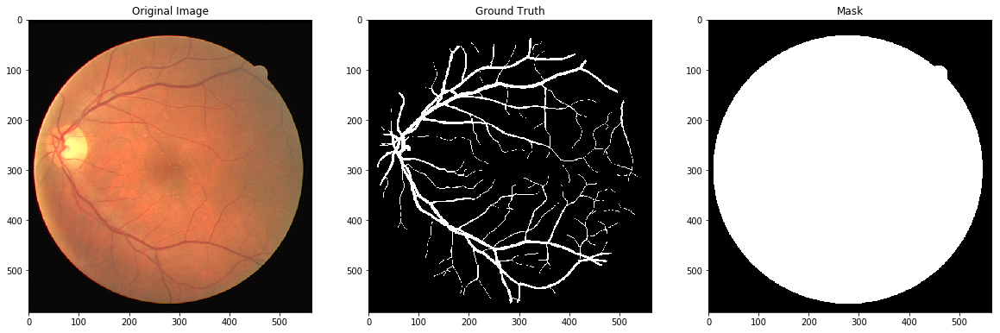

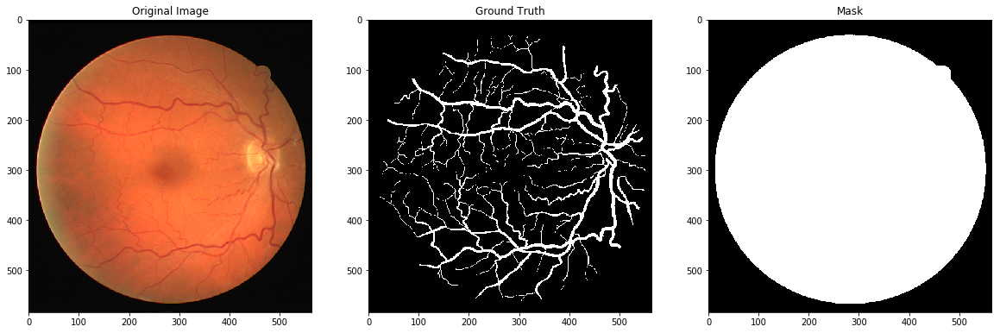

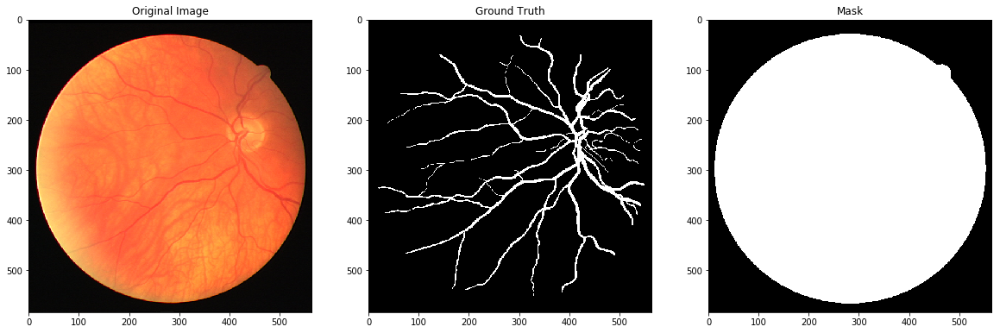

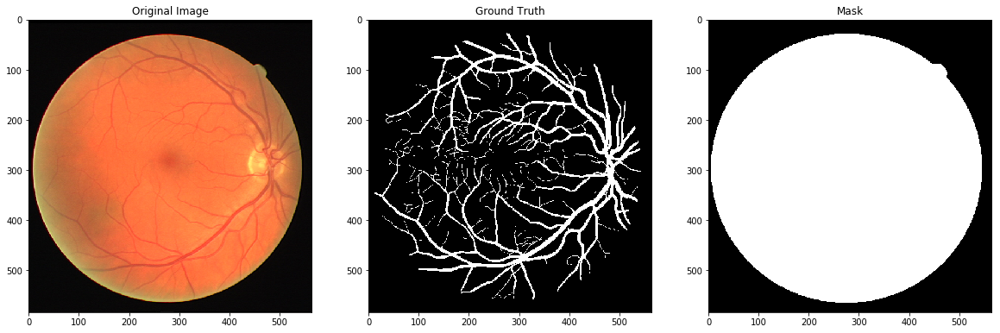

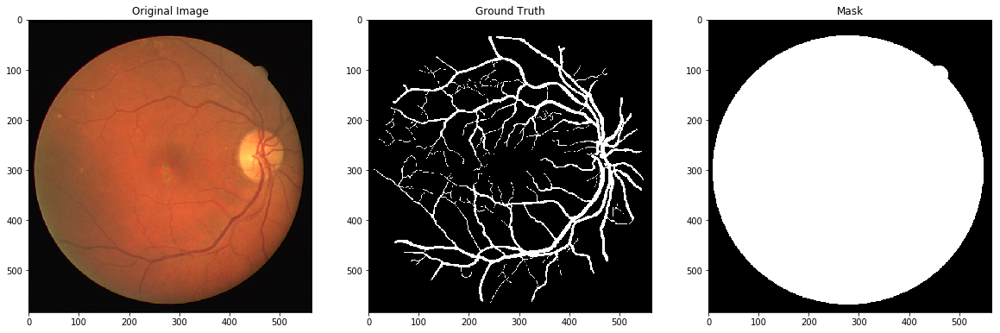

...

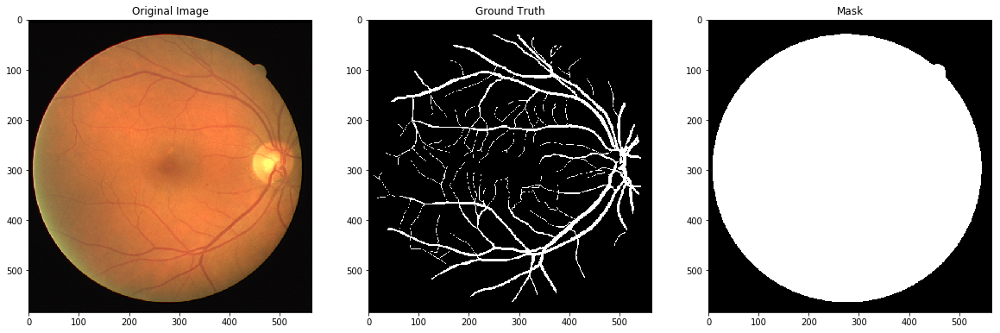

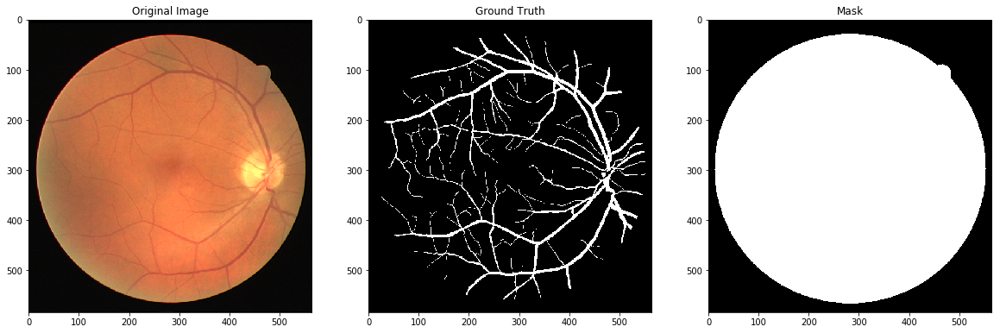

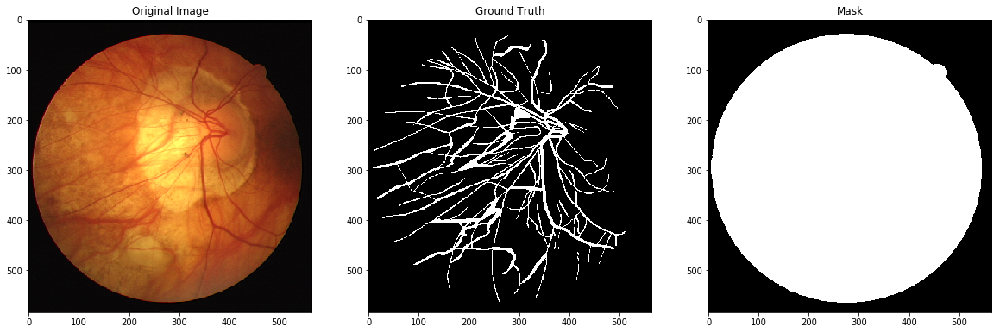

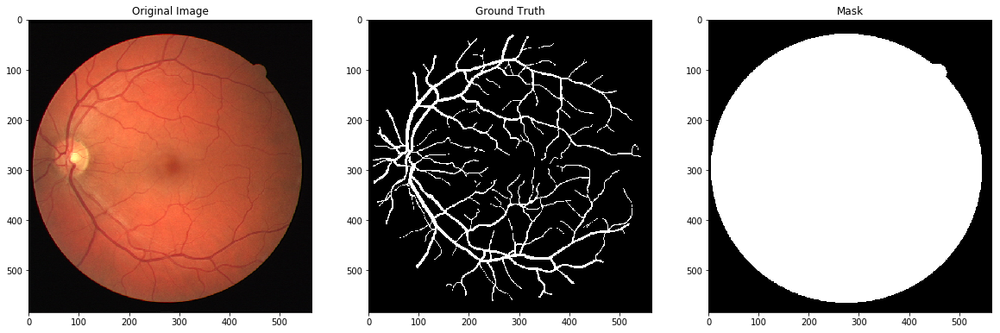

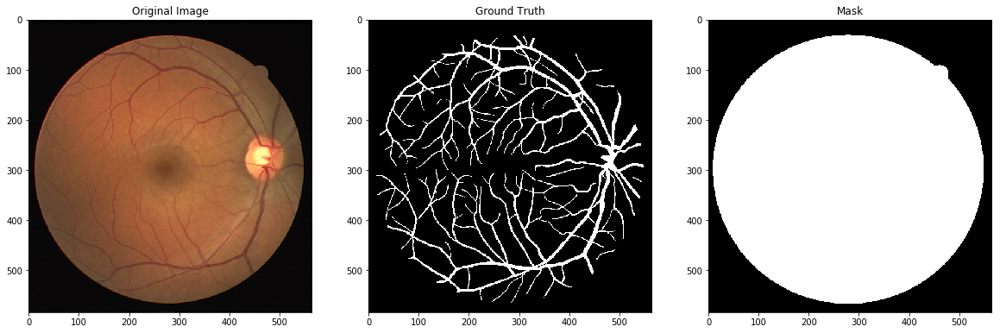

In [7]:
import scipy.misc as m
import matplotlib.pyplot as plt

images, gt, mask = [], [], []
tl_img, tl_gt, tl_mask = [],[],[]

for line in imgs:
    names = line.split()
    img = m.imread(dir_img + names[0])
    seg = m.imread(dir_seg + names[1])
    maskim = m.imread(dir_mask + names[2])
    
    tl_img.append(names[0])
    tl_gt.append(names[1])
    tl_mask.append(names[2])
    
    fig = plt.figure(figsize=(20,40))
    ax = fig.add_subplot(1,3,1)
    ax.imshow(img)
    ax.set_title("Original Image")

    ax = fig.add_subplot(1,3,2)
    ax.imshow(seg, cmap='gray')
    ax.set_title('Ground Truth')
    
    ax = fig.add_subplot(1,3,3)
    ax.imshow(maskim, cmap='gray')
    ax.set_title('Mask')
    
    plt.show()

Adjusting lists of validation data for the specified format of DataGen

In [8]:
vl_img, vl_gt, vl_mask = [], [], []
for line in val_imgs:
    names = line.split()
    vl_img.append(names[0])
    vl_gt.append(names[1])
    vl_mask.append(names[2])

In [9]:
from utils.datagen import DataGenPatches

# Dicts for DataGen
paths_to_files = {'images': dir_img, 'gt': dir_seg, 'mask': dir_mask}
tdata_lists = {'images': tl_img, 'gt':tl_gt, 'mask':tl_mask}
vdata_lists = {'images': vl_img, 'gt':vl_gt, 'mask':vl_mask}

# DataGen
tDataGenP = DataGenPatches(l_patch, s_patch, data_lists=tdata_lists, paths=paths_to_files, window=29, load_all=False, batch_size=256, imsize=(584, 565))
# vDataGenP = DataGenPatches(l_patch, s_patch, data_lists=vdata_lists, paths=paths_to_files, window=29, load_all=False, batch_size=256, imsize=(584, 565))

tDataGenP.__len__()

375

## Training

In [10]:
import os

# Creating directories for weights and models
if not os.path.exists('weights/'):
    os.makedirs('weights/')
    
if not os.path.exists('pretrained_models/'):
    os.makedirs('pretrained_models/')
    
# if os.path.exists('weights/sgannet_drive.hdf5'):
#     sconv_model.load_weights('sgannet_drive.hdf5')

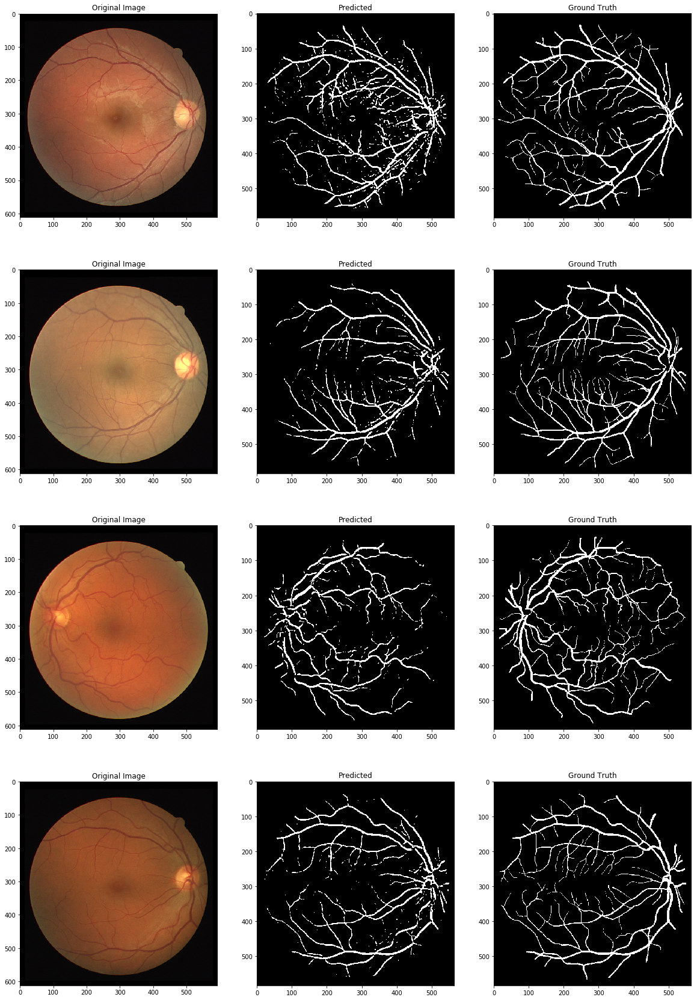

Epoch 0
Precision 0.7755058334013217
Recall 0.6871334724895407
F1 0.7286499331650083
Accuracy 0.9570879803612559


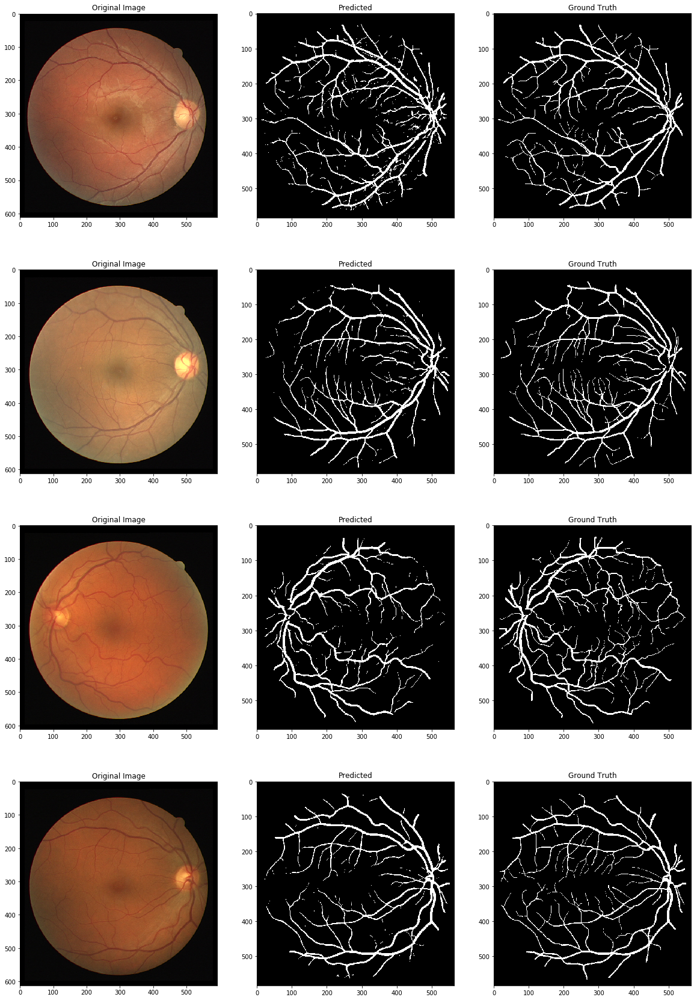

Epoch 10
Precision 0.792215416699526
Recall 0.8169553706163536
F1 0.8043952133102007
Accuracy 0.9666853558007031


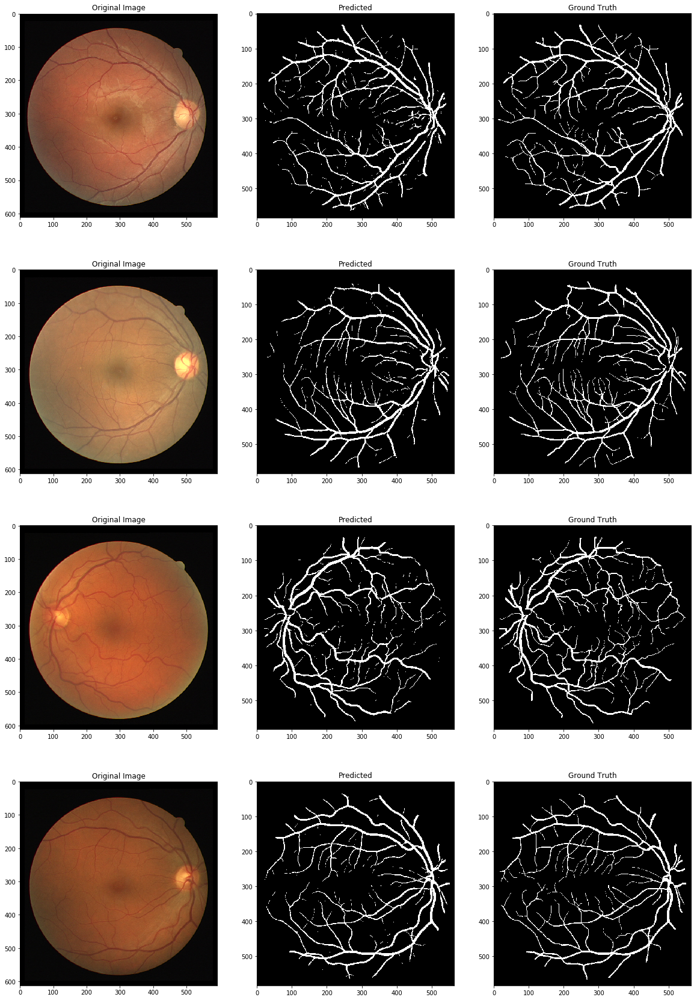

Epoch 20
Precision 0.808366815072212
Recall 0.807205399983735
F1 0.8077856900644286
Accuracy 0.9677892774881803


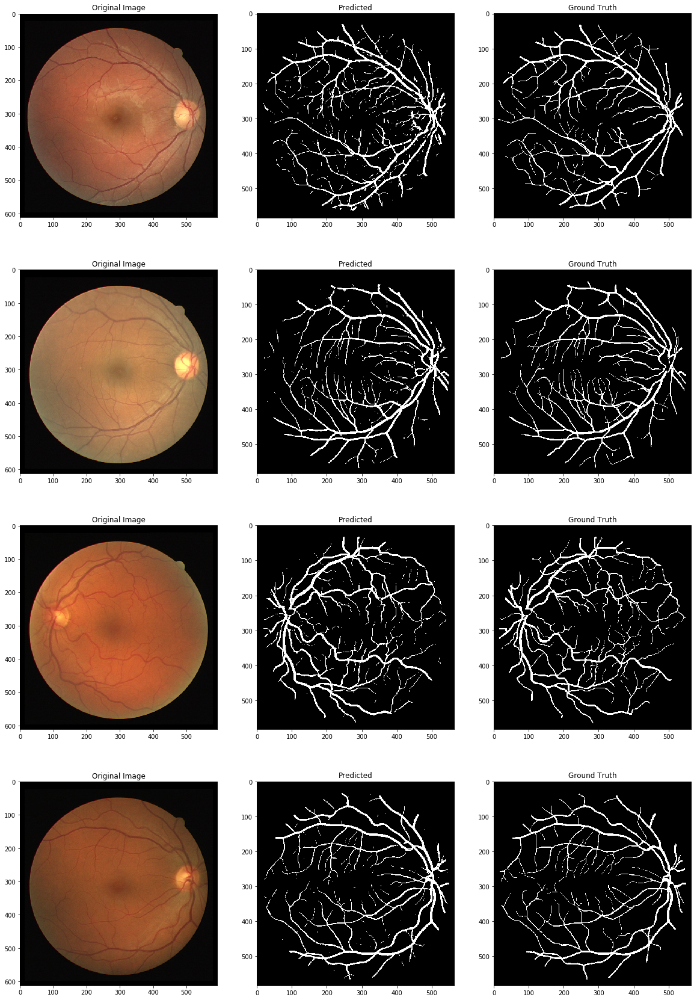

Epoch 30
Precision 0.7795741291508851
Recall 0.8313499055725736
F1 0.8046299697399032
Accuracy 0.966148927142684


KeyboardInterrupt: 

In [11]:
from keras.utils import generic_utils
from utils.image_utils import plot_predicted_images
from utils.evaluation import precision, recall, f1, acc

it = 101

fmeasure_old = -1
for j in range(it):
    tDataGenP.on_epoch_end()
    bs = tDataGenP.batch_size
    
    for i in range(len(tDataGenP)):
        # Get data from DataGen
        X_orig, y_orig = tDataGenP[i]
        # Create fake data for half of the data
        n = X_orig.shape[0]
        X_toG = X_orig[n//2:]
        y = np.zeros(y_orig.shape)
        y[:n//2] = y_orig[:n//2]
        y_gen = gen_nn.predict(X_toG)
        y[n//2:] = y_gen
        
        # Data for discriminator D
        X_Dtrain = [X_orig,y]
        y_Dtrain = np.zeros((n,1,1,2))
        y_Dtrain[n//2:,:,:, 0] = 1
        y_Dtrain[:n//2,:,:, 1] = 1
        # Train D
        disc_nn.trainable = True
        D_loss = disc_nn.train_on_batch(X_Dtrain, y_Dtrain)
        
        # Data for generator G
        X_Gtrain = X_orig
        y_Gtrain = np.zeros((n,1,1,2))
        y_Gtrain[:,:,:,1] = 1
        # Freeze D
        disc_nn.trainable = False
        # Train G
        G_loss = dcgan_nn.train_on_batch(X_Gtrain, [y_orig, y_Gtrain])
        
    if j % 10 == 0:
        imgs, gt = plot_predicted_images(gen_nn, vdata_lists, paths_to_files, window=l_patch-s_patch+1)
        fmeasure = f1(imgs,gt)
        print('Epoch', j)
        print('Precision', precision(imgs,gt))
        print('Recall', recall(imgs,gt))
        print('F1', fmeasure)
        print('Accuracy', acc(imgs,gt))
        
        if fmeasure > fmeasure_old:
            gen_nn.save('pretrained_models/G.h5')
            disc_nn.save('pretrained_models/D.h5')
            dcgan_nn.save('pretrained_models/DCGAN.h5')
            fmeasure_old = fmeasure

# Comparison against SConvNet without adversarial framework

In [12]:
tl_img, tl_gt, tl_mask, gts = [], [], [], []
for line in test_imgs:
    names = line.split()
    tl_img.append(names[0])
    tl_gt.append(names[1])
    
print(len(tl_img))

20


/home/augusto/anaconda3/lib/python3.6/site-packages/keras/engine/saving.py:304: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


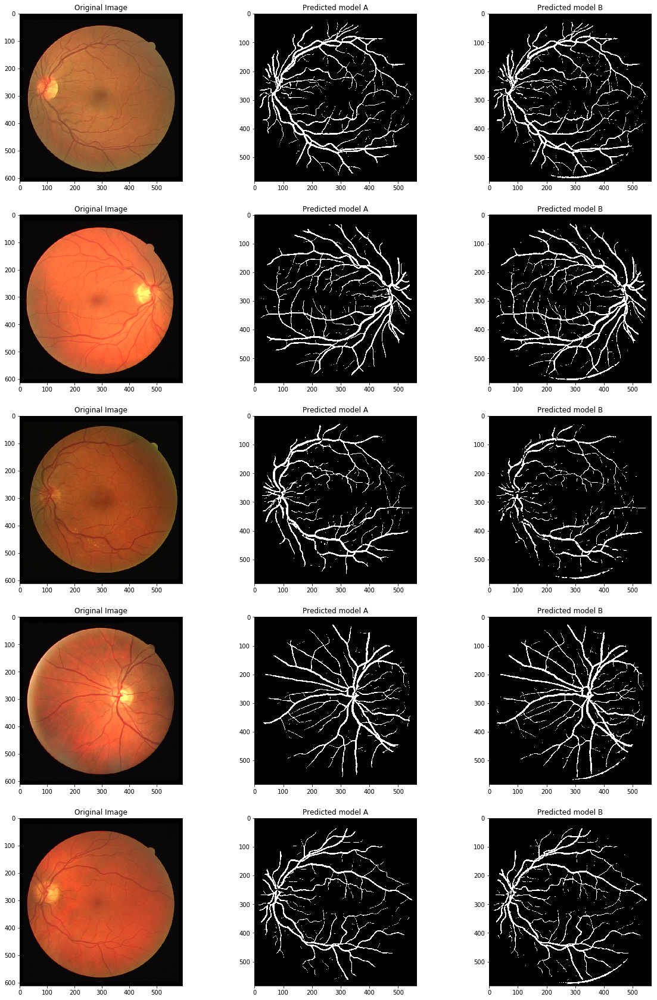

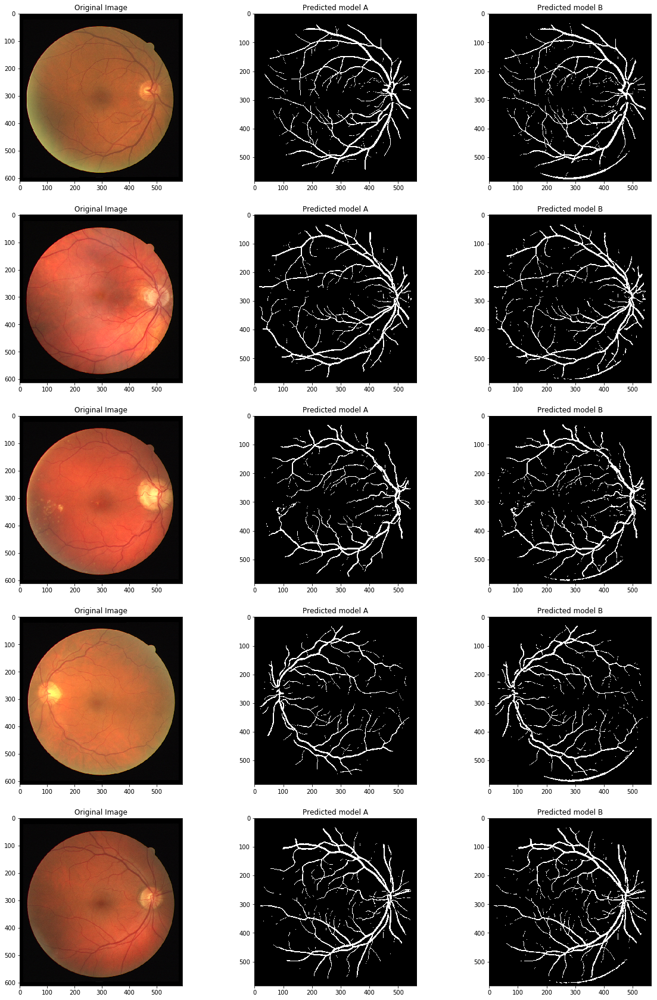

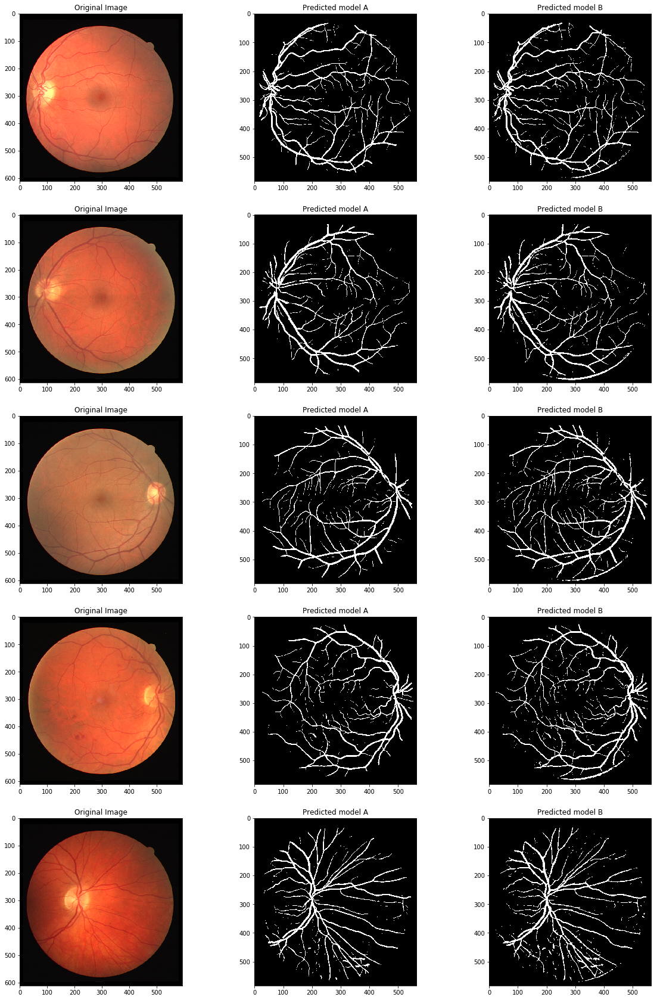

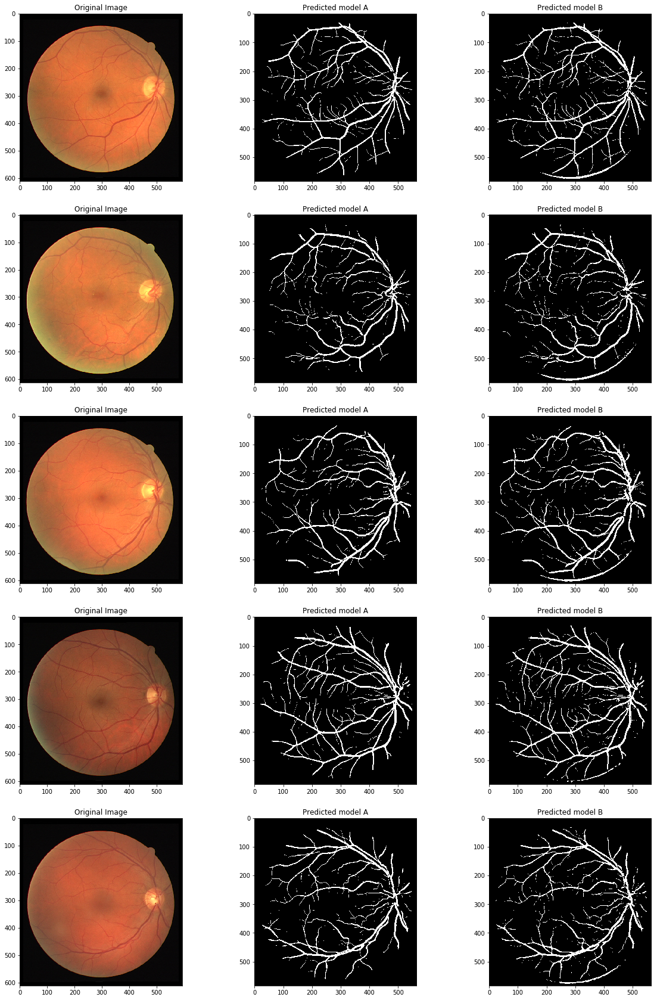

Precision 0.8517073414145446
Recall 0.7678533424460805
F1 0.8076095393129503
Accuracy 0.9679605103648927
Precision 0.7959789250301855
Recall 0.7528363425585479
F1 0.7738067608364123
Accuracy 0.9614545702509395


In [13]:
from keras.models import load_model
from utils.image_utils import plot_comparison

    
paths_to_files = {'images': dir_test_img, 'gt': dir_test_seg, 'mask': dir_mask}
    
gen_nn = load_model('pretrained_models/G.h5')
sconv_model = load_model('pretrained_models/sconvnet_drive.h5')

gts = []
for i in tl_gt:
    gts.append(m.imread(paths_to_files['gt']+i, mode='L'))
gts = np.asarray(gts)
    
predictionsA, predictionsB = [],[]
for i in range(0,19,5):
    tdata_lists = {'images': tl_img[i:i+5], 'gt':tl_gt[i:i+5], 'mask':None}
    predA, predB = plot_comparison(gen_nn, sconv_model, tdata_lists, paths_to_files, window=l_patch-s_patch+1)
    predictionsA.append(predA)
    predictionsB.append(predB)
    
predictionsA = np.concatenate(predictionsA, axis=0)
predictionsB = np.concatenate(predictionsB, axis=0)
    
print('Precision', precision(predictionsA,gts))
print('Recall', recall(predictionsA,gts))
print('F1', f1(predictionsA,gts))
print('Accuracy', acc(predictionsA,gts))
        
print('Precision', precision(predictionsB,gts))
print('Recall', recall(predictionsB,gts))
print('F1', f1(predictionsB,gts))
print('Accuracy', acc(predictionsB,gts))